In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix
import pynapple as nap
from spatial_manifolds.toroidal import *
from spatial_manifolds.behaviour_plots import *

from spatial_manifolds.mlencoding import *
from spatial_manifolds.circular_decoder import circular_decoder, cross_validate_decoder, cross_validate_decoder_time, circular_nanmean
from spatial_manifolds.data.curation import curate_clusters
from scipy.stats import zscore
from spatial_manifolds.util import gaussian_filter_nan
from spatial_manifolds.predictive_grid import compute_travel_projected, wrap_list
from spatial_manifolds.behaviour_plots import *
from spatial_manifolds.detect_grids import *
from spatial_manifolds.brainrender_helper import *

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
fig_path = '/Users/harryclark/Documents/figs/FIGURE1/'
mouse = 28
day = 25

# good examples include 
#mice = [25, 25, 26, 27, 29, 28]
#days = [25, 24, 18, 26, 23, 25]

28 25
optimal travel lag is 9.75975975975976 cm based on kde of travel at max spatial information
optimal travel lag is 9.75975975975976 cm
firing rates are similar for cluster id 1, VR: 0.5337966319607044, OF1: 1.4824449080334656
firing rates are similar for cluster id 3, VR: 6.147977090095408, OF1: 19.44473571037229
firing rates are similar for cluster id 10, VR: 0.4853543547147068, OF1: 1.9312962829658205
firing rates are similar for cluster id 14, VR: 0.7196472917794836, OF1: 0.8235805044630364
firing rates are similar for cluster id 15, VR: 0.3088195174432347, OF1: 1.0014738934270524
firing rates are similar for cluster id 22, VR: 1.7192350511055496, OF1: 2.2467276161751633
firing rates are similar for cluster id 25, VR: 5.513569574623785, OF1: 9.686953893494234
firing rates are similar for cluster id 28, VR: 0.6045968833202393, OF1: 1.2526659472882784
firing rates are similar for cluster id 30, VR: 2.6983280008275394, OF1: 5.256914359987562
firing rates are similar for cluster id

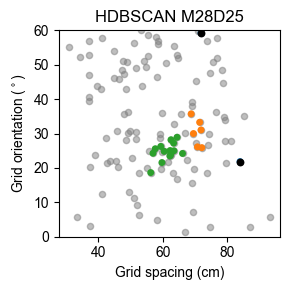

for module 0, there are 6 cells with average spacing 70.76972276610992
for module 1, there are 15 cells with average spacing 61.33629235763494
module 1 contains cells from ['ENTm3' 'ENTm5']
module 0 contains cells from ['ENTm3' 'ENTm5']
removing cluster 139 from module 1 because rate is too low (below 1 Hz)
removing cluster 149 from module 1 because peak 76 is not within tolerance of median peak 196.0
removing cluster 151 from module 1 because rate is too low (below 1 Hz)
removing cluster 153 from module 1 because rate is too low (below 1 Hz)
removing cluster 174 from module 1 because peak 70 is not within tolerance of median peak 196.0
removing cluster 99 from module 0 because rate is too low (below 1 Hz)
removing cluster 108 from module 0 because rate is too low (below 1 Hz)
28 25
for module 1, there are 10 cells
for module 0, there are 4 cells
plotting vr rate maps using cluster_ids [126, 147, 154, 155, 156, 158, 160, 162, 188, 284]
n trials: 214
n trials: 214
n trials: 214
n trials

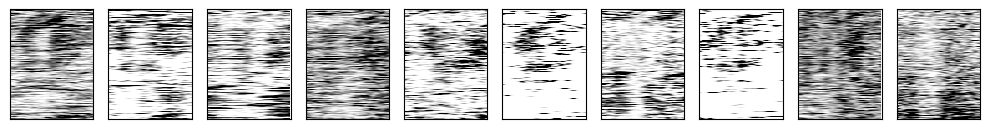

plotting vr rate maps using cluster_ids [140, 242, 258, 287]
n trials: 214
n trials: 214
n trials: 214
n trials: 214


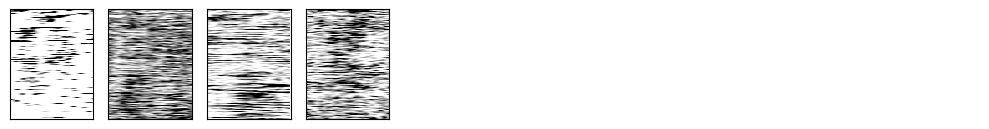

plotting vr rate maps using cluster_ids [1, 3, 10, 14, 15, 22, 25, 28, 30, 39, 41, 46, 48, 51, 55, 56, 57, 59, 61, 69, 73, 75, 77, 78, 83, 87, 96, 113, 117, 121, 124, 130, 136, 170, 176, 186, 221, 226, 227, 228, 232, 236, 244, 250, 254, 264, 273, 276, 285, 294, 310, 313, 327, 328, 333, 337, 338, 339, 341, 344, 347, 352, 362, 364, 365, 369, 371, 377, 379, 380, 383, 385, 386, 387, 391, 392, 393, 403, 404, 406, 407, 412, 414, 423, 425, 436, 442, 447, 453, 461, 462, 476, 478, 484]
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214


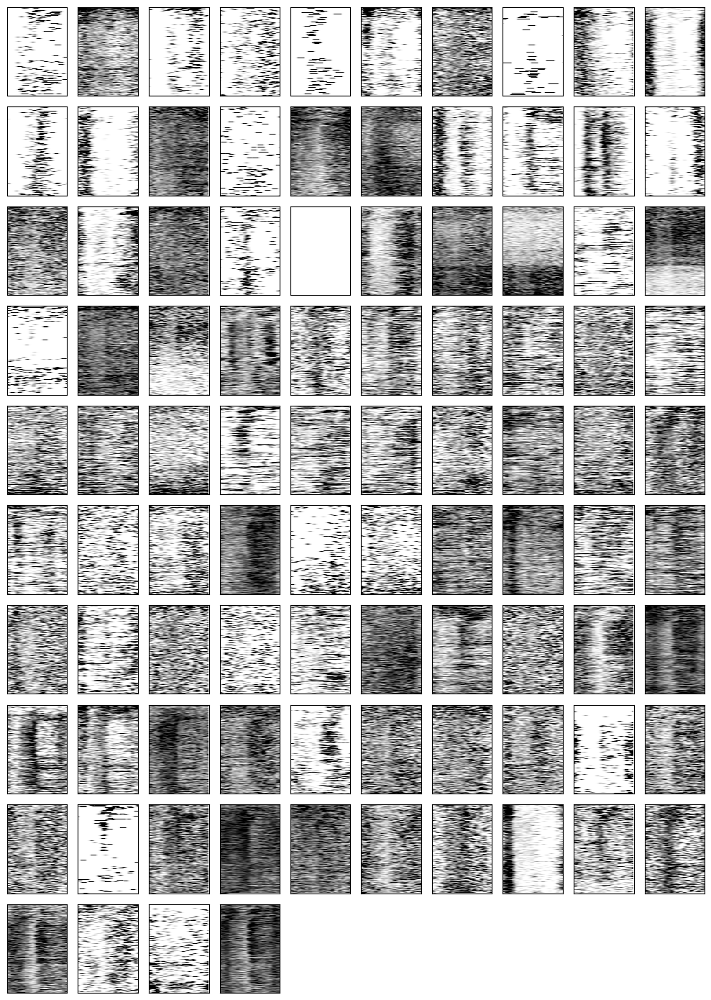

plotting vr rate maps using cluster_ids [202, 316, 326, 335, 342, 349, 353, 354, 356, 366, 419, 489]
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214


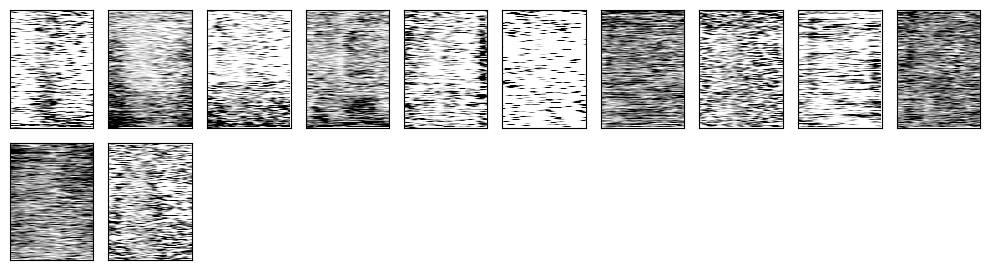

plotting vr rate maps using cluster_ids [99, 108, 126, 139, 140, 147, 149, 151, 153, 154, 155, 156, 158, 160, 162, 174, 177, 188, 242, 258, 284, 287, 363]
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214


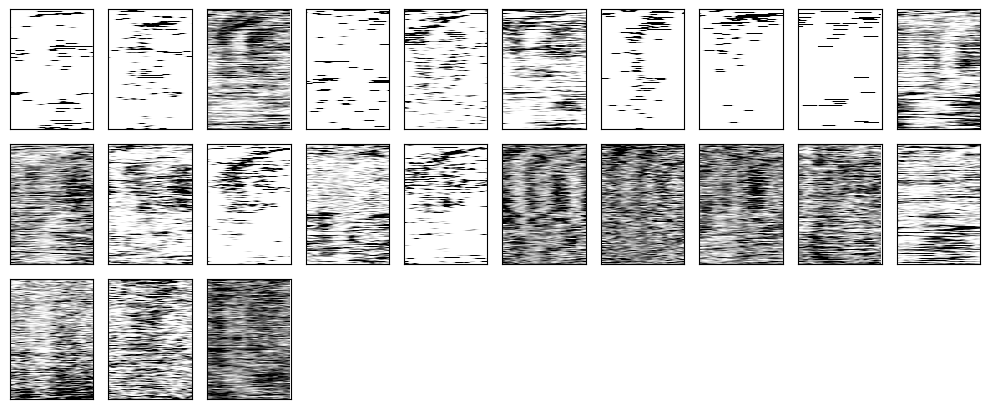

plotting vr rate maps using cluster_ids []


In [3]:
gcs, ngs, ns, sc, ngs_ns, all = cell_classification_of1(mouse, day, percentile_threshold=95) # subset
rc, rsc, vr_ns = cell_classification_vr(mouse, day)

g_m_ids, g_m_cluster_ids = HDBSCAN_grid_modules(gcs, all, mouse, day, min_cluster_size=3, cluster_selection_epsilon=3, 
                                                figpath=fig_path, curate_with_vr=True, curate_with_brain_region=True) # create grid modules using HDBSCAN    

plot_grid_modules_rate_maps(gcs, g_m_ids, g_m_cluster_ids, mouse, day, figpath=fig_path)

# we now have cluster ids classified into modules, non grid spatial cells and non spatial cells 
# as defined by activity in the open field
g_m_cluster_ids = sorted(g_m_cluster_ids, key=len, reverse=True) 
cluster_ids_by_group = []
cluster_ids_by_group.extend(g_m_cluster_ids) # grid cells by module [0,1,2...]
cluster_ids_by_group.append(ngs.cluster_id.values.tolist()) # non grid spatial [-4]
cluster_ids_by_group.append(ns.cluster_id.values.tolist()) # non spatial cells [-3]
cluster_ids_by_group.append(gcs.cluster_id.values.tolist()) # all grid cells [-2]
cluster_ids_by_group.append(sc.cluster_id.values.tolist()) # speed cells [-1]

for m, cluster_ids in enumerate(cluster_ids_by_group):
    plot_vr_rate_maps(mouse, day, cluster_ids, label=f'{m}', figpath=fig_path)

#plot_vr_rate_maps(mouse, day, rc.cluster_id.values, label=f'ramp_cells', figpath=fig_path)
#plot_vr_rate_maps(mouse, day, rsc.cluster_id.values, label=f'speed_ramp_cells', figpath=fig_path)

n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214
n trials: 214


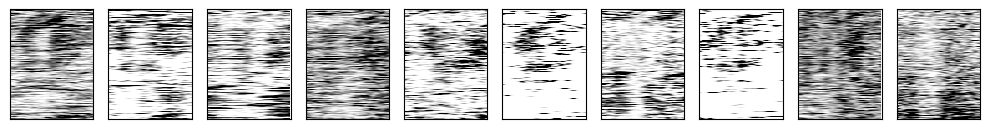

In [4]:
cluster_ids=cluster_ids_by_group[0]
tcs,tcs_time,_,_,_,_ = compute_vr_tcs(mouse, day)
ncols = 10
nrows = int(np.ceil(len(cluster_ids)/ncols))
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(10, 1.4*nrows), squeeze=False)
counter = 0
for j in range(nrows):
    for i in range(ncols):
        if counter<len(cluster_ids):
            index = cluster_ids[counter]
            plot_firing_rate_map(ax[j, i], 
                                zscore(tcs[index]),
                                bs=bs,
                                tl=tl,
                                p=95)
        else:
            ax[j, i].axis('off')
        counter+=1
        ax[j, i].set_xticks([])
        ax[j, i].set_yticks([])
        ax[j, i].xaxis.set_tick_params(labelbottom=False)
        ax[j, i].yaxis.set_tick_params(labelleft=False)
plt.tight_layout()
plt.show()

In [5]:
'''for id in gcs.cluster_id.values:
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in [id] if cluster_id in tcs}
    S, _, _, _ = get_spectrogram(tcs_to_use, tl, bs=bs)
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(4, 2))
    plot_firing_rate_map(ax[0],zscore(tcs[id]),bs=bs,tl=tl,p=95)
    S = S.mean(0)
    ax[1].imshow(S,origin='lower',aspect='auto',vmax=0.25,cmap='magma')
    ax[1].set_yticks([0, len(S)/2, len(S)], [0, 1, 2])
    ax[1].set_ylabel(f'Frequency (m-1)')
    plt.show()'''


"for id in gcs.cluster_id.values:\n    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in [id] if 
cluster_id in tcs}\n    S, _, _, _ = get_spectrogram(tcs_to_use, tl, bs=bs)\n    fig, ax = plt.subplots(ncols=2, 
nrows=1, figsize=(4, 2))\n    plot_firing_rate_map(ax[0],zscore(tcs[id]),bs=bs,tl=tl,p=95)\n    S = S.mean(0)\n    
ax[1].imshow(S,origin='lower',aspect='auto',vmax=0.25,cmap='magma')\n    ax[1].set_yticks([0, len(S)/2, len(S)], 
[0, 1, 2])\n    ax[1].set_ylabel(f'Frequency (m-1)')\n    plt.show()"

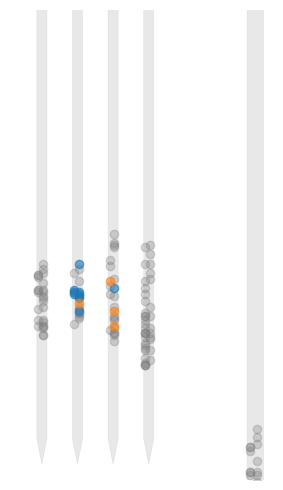

In [6]:

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(4, 5), squeeze=False)
plot_NP2_probe(ax[0,0], sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa')
ax[0,0].scatter(ngs['probe_x'], ngs['probe_y'], color='tab:grey', alpha=0.3)
for m, cluster_ids in enumerate(g_m_cluster_ids):
    m_gcs = gcs[gcs.cluster_id.isin(cluster_ids)]
    ax[0,0].scatter(m_gcs['probe_x'], m_gcs['probe_y'], alpha=0.6)
ax[0,0].set_xlim(-200, 1000)
ax[0,0].set_ylim(-300, 3000)
plot_NP2_probe(ax[0,1], sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa')
ax[0,1].scatter(ngs['probe_x'], ngs['probe_y'], color='tab:grey', alpha=0.3)
for m, cluster_ids in enumerate(g_m_cluster_ids):
    m_gcs = gcs[gcs.cluster_id.isin(cluster_ids)]
    ax[0,1].scatter(m_gcs['probe_x'], m_gcs['probe_y'], alpha=0.6)
ax[0,1].set_xlim([-25, 100])
ax[0,1].set_ylim([1000,3000])
plt.tight_layout()
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/M{mouse}D{day}_probe.pdf',  bbox_inches='tight')
plt.show()

Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules


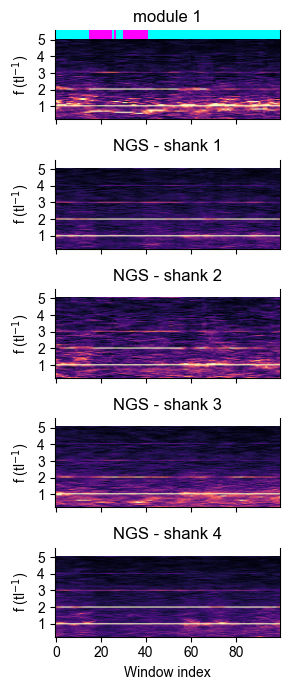

In [86]:
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(3, 7), squeeze=False, sharex=True)
peak_indices = [12, 28, 44, 60, 76]
peak_indices = [28, 44, 60, 76]

cluster_ids = g_m_cluster_ids[0]
tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
results = spectral_analysis(tcs_to_use, tl, bs=bs)
spectrograms = results[3] 
S = spectrograms.mean(0)
max_peaks = np.argmax(S, axis=0)
labels = np.isin(max_peaks, peak_indices).astype(int)
ax[0,0].set_title(f'module {1}')
ax[0,0].imshow(S,origin='lower',aspect='auto',vmax=0.25,cmap='magma')
peak_indices = [12, 28, 44, 60, 76]

ax[0,0].set_yticks(peak_indices, [1, 2, 3, 4, 5])
ax[0,0].spines['top'].set_visible(False)
ax[0,0].set_ylabel(r'f (tl$^{-1}$)')
ax[0,0].scatter(np.arange(S.shape[1]),
                np.full(S.shape[1], 81),  # y just above the top
                c=labels,
                cmap='cool',
                marker='s',
                vmin=0, 
                vmax=1,
                s=50,
                alpha=1,
                edgecolor='none',
                clip_on=True
                )
for s in [0,1,2,3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3] 
    fvalid = results[5]

    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels = np.isin(max_peaks, peak_indices).astype(int)
    ax[s+1,0].spines['top'].set_visible(False)
    ax[s+1,0].set_title(f'NGS - shank {s+1}')
    ax[s+1,0].imshow(S,origin='lower',aspect='auto',vmax=0.25,cmap='magma')
    ax[s+1,0].set_ylabel(r'f (tl$^{-1}$)')
    ax[s+1,0].set_yticks(peak_indices, [1, 2, 3, 4, 5])
    ax[s+1,0].scatter(np.arange(S.shape[1]),
                      np.full(S.shape[1], 81),  # y just above the top
                      c=labels,
                      cmap='cool',
                      marker='s',
                      vmin=0, 
                      vmax=1,
                      s=50,
                      alpha=0,
                      edgecolor='none',
                      clip_on=True
                      )
ax[-1,0].set_xlabel('Window index')
plt.tight_layout()
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/M{mouse}D{day}_joint_spectrograms.pdf',  bbox_inches='tight')
plt.show()

Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules


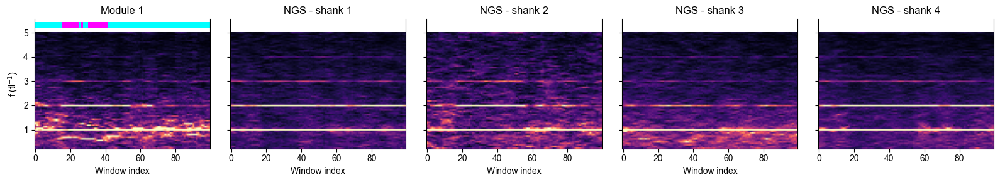

In [93]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(16, 3), squeeze=False, sharey=True)
peak_indices = [12, 28, 44, 60, 76]
peak_indices = [28, 44, 60, 76]

# Module 1
cluster_ids = g_m_cluster_ids[0]
tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
results = spectral_analysis(tcs_to_use, tl, bs=bs)
spectrograms = results[3]
S = spectrograms.mean(0)
max_peaks = np.argmax(S, axis=0)
labels = np.isin(max_peaks, peak_indices).astype(int)
ax[0,0].set_title('Module 1')
ax[0,0].imshow(S, origin='lower', aspect='auto', vmax=0.25, cmap='magma')
peak_indices = [12, 28, 44, 60, 76]
ax[0,0].set_yticks(peak_indices)
ax[0,0].set_yticklabels([1, 2, 3, 4,5])
ax[0,0].spines['top'].set_visible(False)
ax[0,0].set_ylabel(r'f (tl$^{-1}$)')
ax[0,0].scatter(np.arange(S.shape[1]),
                np.full(S.shape[1], 81),
                c=labels,
                cmap='cool',
                marker='s',
                vmin=0,
                vmax=1,
                s=50,
                alpha=1,
                edgecolor='none',
                clip_on=True
                )

# NGS by shank (4 columns)
for s in [0, 1, 2, 3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3]
    fvalid = results[5]

    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels = np.isin(max_peaks, peak_indices).astype(int)
    ax[0, s+1].spines['top'].set_visible(False)
    ax[0, s+1].set_title(f'NGS - shank {s+1}')
    ax[0, s+1].imshow(S, origin='lower', aspect='auto', vmax=0.25, cmap='magma')
    ax[0, s+1].set_yticks(peak_indices)
    ax[0, s+1].set_yticklabels([1, 2, 3, 4,5])
    ax[0, s+1].scatter(np.arange(S.shape[1]),
                       np.full(S.shape[1], 81),
                       c=labels,
                       cmap='cool',
                       marker='s',
                       vmin=0,
                       vmax=1,
                       s=50,
                       alpha=0,
                       edgecolor='none',
                       clip_on=True
                       )
    ax[0, s].set_xlabel('Window index')
ax[0, 0].set_xlabel('Window index')
plt.tight_layout(w_pad=2)
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/M{mouse}D{day}_joint_spectrograms.pdf', bbox_inches='tight')
plt.show()

In [72]:
Mouse = f'M{mouse}'
data_paths = [f"/Users/harryclark/Documents/brainrender/probe_data/{Mouse}_probe_locations_{a}.mat" for a in [1,2,3,4]]
shank_offsets_SC = pd.read_csv('/Users/harryclark/Documents/brainrender/probe_data/shank_offsets.csv')
clusters_df = pd.read_csv(f'/Users/harryclark/Documents/brainrender/probe_data/extremum_channel_locations_kilosort4_0.csv')
clusters_df = clusters_df[clusters_df['mouse'] == mouse]
shank_offsets_SC = shank_offsets_SC[shank_offsets_SC['mouse'] == mouse]
clusters_df = reconstruct_shank_id(clusters_df, mouse)
probes_locs = [read_probe_mat(data_path) for data_path in data_paths]
adjusted_probes_locs_CCF = np.array([adjust_probe_locs(probe_locs) for probe_locs in probes_locs])
adjusted_probe_locs_SC, adjusted_probe_locs_CCF = correct_for_left_side(adjusted_probes_locs_CCF)
adjusted_probe_locs_SC, adjusted_probe_locs_CCF = adjust_to_shank_offsets(adjusted_probe_locs_SC, shank_offsets_SC)

ymin = -300; ymax = 3000
xmin = -200; xmax = 1000
xs = np.arange(xmin, xmax, 1)
ys = np.arange(ymin, ymax, 1)

annotations = np.zeros((len(ys), len(xs)), dtype=object)
for yi, y in enumerate(ys):
    for xi, x in enumerate(xs):
        coord_SC, coord_CCF  = brain_coord_from_xy(x, y, adjusted_probe_locs_SC, shank_id=0)
        # use the CCF coordinates, get an index and look up the annotation in the brainrender allen_brain_10um volume
        z_CCF, y_CCF, x_CCF = np.round(coord_CCF/10).astype(int)
        annotation_index = annotations_set[z_CCF,y_CCF,x_CCF]
        if len(structure_set[structure_set['id'] == annotation_index]) ==1:
            annotation = structure_set[structure_set['id'] == annotation_index]['acronym'].iloc[0]
        else:
            annotation ='root' # out of brain
        annotations[yi,xi] = annotation
annotation_colors = get_annotation_colors_2D(annotations)

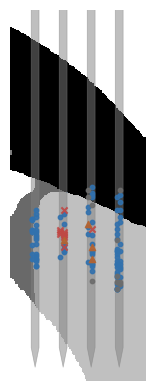

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
unique_colors = np.unique(annotation_colors)
for color in unique_colors:
    border_points = extract_border(annotation_colors, color, only_border=False)
    x_points = xs[border_points[:, 1]]
    y_points = ys[border_points[:, 0]]
    ax.scatter(x_points, y_points, color=color, s=1, label=color, rasterized=True)
plot_NP2_probe(ax, sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa', 
               probe_alpha=0.5, contacts_alpha=0.0, probe_color='grey', probe_edgecolor='black')
# plot cell locations 
ax.scatter(ngs.probe_x.values, ngs.probe_y.values, marker='o', color="#3171ae", alpha=0.9, s=10)
ax.scatter(ns.probe_x.values, ns.probe_y.values, marker='o', color="#6c6c6c", alpha=0.9, s=10)

markers = ['x','^', 's']
colors=["#c04744", "#B6632F", "#c09744"]
for i, cluster_ids in enumerate(g_m_cluster_ids):
    gc_m = gcs[np.isin(gcs.cluster_id, cluster_ids)]
    ax.scatter(gc_m.probe_x.values, gc_m.probe_y.values, marker=markers[i], color=colors[i], alpha=0.9, s=20)
plt.tight_layout()
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/M{mouse}D{day}_probe_brainrender.pdf', bbox_inches='tight', dpi=500) # use tight layout to avoid cutting off labels
plt.show()

In [8]:
# Calculate mean probe_x and probe_y for cluster_ids in g_m_cluster_ids[0]
cluster_ids = g_m_cluster_ids[0]
subset = all[all['cluster_id'].isin(cluster_ids)]
mean_x = subset['probe_x'].mean()
mean_y = subset['probe_y'].mean()
print(f"Mean probe_x: {mean_x:.2f}, Mean probe_y: {mean_y:.2f}")

Mean probe_x: 297.40, Mean probe_y: 1020.00


In [ ]:
# For each cell, compute the sum of squared error (SSE) between task-anchored and task-independent rate maps,
# and use this as the metric instead of fold change.

sse_values = []
dists_from_mean = []
shanks = []
sig_cells = []

n_shuffles = 100  # Number of shuffles for null distribution
tcs, _, _ , last_ephys_bin, beh, _ = compute_vr_tcs(mouse, day, apply_zscore=False)

for idx, id in enumerate(all.cluster_id.values):
    tc = tcs[id]
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin]
    tcz = zscore(tc)
    bin_config = get_bin_config('VR')
    trial_labels = get_kmeans_spatial_labels(tcz, labels, bs=bs, tl=tl)
    trials = beh['trials'][:len(trial_labels)]

    # Real rate maps
    x0, y0 = get_avg_profile(tcz, bs, tl, mask=trial_labels == 0)
    x1, y1 = get_avg_profile(tcz, bs, tl, mask=trial_labels == 1)

    # Ensure same length for SSE calculation
    min_len = min(len(y0), len(y1))
    y0 = y0[:min_len]
    y1 = y1[:min_len]
    sse_real = np.sum((y1 - y0) ** 2)
    sse_values.append(sse_real)

    # Null distribution by shuffling
    sse_shuffles = []
    for _ in range(n_shuffles):
        shuffled = np.random.permutation(trial_labels)
        x0s, y0s = get_avg_profile(tcz, bs, tl, mask=shuffled == 0)
        x1s, y1s = get_avg_profile(tcz, bs, tl, mask=shuffled == 1)
        min_len_shuf = min(len(y0s), len(y1s))
        if min_len_shuf > 0:
            y0s = y0s[:min_len_shuf]
            y1s = y1s[:min_len_shuf]
            sse_shuffles.append(np.sum((y1s - y0s) ** 2))
        else:
            sse_shuffles.append(np.nan)
    sse_shuffles = np.array(sse_shuffles)
    p99 = np.nanpercentile(sse_shuffles, 99)
    sig_cells.append(sse_real > p99)

    probe_x = all[all.cluster_id == id].probe_x.values[0]
    probe_y = all[all.cluster_id == id].probe_y.values[0]
    dists_from_mean.append(np.sqrt((probe_x - mean_x) ** 2 + (probe_y - mean_y) ** 2))
    s = probe_x // 250
    shanks.append(s)

sse_values = np.array(sse_values)
dists_from_mean = np.array(dists_from_mean)
sig_cells = np.array(sig_cells)
shanks = np.array(shanks)

Shank 1: 15 significant NGS / 26 total NGS (0.58 proportion)
Shank 2: 10 significant NGS / 10 total NGS (1.00 proportion)
Shank 3: 13 significant NGS / 20 total NGS (0.65 proportion)
Shank 4: 25 significant NGS / 38 total NGS (0.66 proportion)


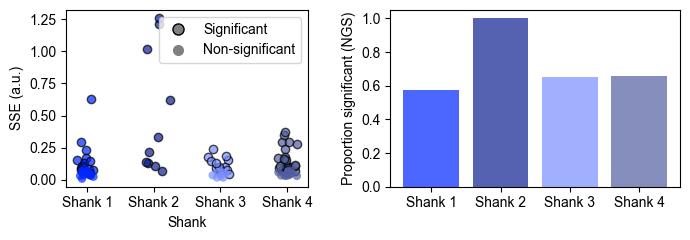

: 

In [ ]:
from matplotlib.lines import Line2D

# Get NGS cell indices
ngs_cluster_ids = set(ngs.cluster_id.values)
ngs_mask = np.array([id in ngs_cluster_ids for id in all.cluster_id.values])
ngs_sse = sse_values[ngs_mask]

# Filter arrays to only NGS cells
ngs_sig_cells = sig_cells[ngs_mask]
ngs_shanks = shanks[ngs_mask]

shank_labels = ['Shank 1', 'Shank 2', 'Shank 3', 'Shank 4']
colors = ["#0026ff", "#0b1f90", "#7a8eff", "#525ea0"]  # pastel blue, green, pink, orange

n_sig = []
n_total = []
proportion = []

for s in range(4):
    mask = (ngs_shanks == s)
    n_sig.append(np.sum(ngs_sig_cells[mask]))
    n_total.append(np.sum(mask))
    if n_total[-1] > 0:
        proportion.append(n_sig[-1] / n_total[-1])
    else:
        proportion.append(np.nan)

# Print summary
for i, label in enumerate(shank_labels):
    print(f"{label}: {n_sig[i]} significant NGS / {n_total[i]} total NGS ({proportion[i]:.2f} proportion)")


# Create the figure and axes for the merged plots
fig, (ax2, ax1) = plt.subplots(1, 2, figsize=(7, 2.5), gridspec_kw={'width_ratios': [1, 1.2]})

# Bar plot (left)
ax1.bar(shank_labels, proportion, color=colors, alpha=0.7)
ax1.set_ylabel('Proportion significant (NGS)')
ax1.set_ylim(0, 1.05)
# Remove title
# ax1.set_title('Proportion of significant NGS\ncells per shank')

# Jitter plot (right)
for s in range(4):
    y = ngs_sse[ngs_shanks == s]
    sig = ngs_sig_cells[ngs_shanks == s]
    x = np.random.normal(s, 0.08, size=len(y))  # jitter
    ax2.scatter(x[sig], y[sig]/(tl/bs), color=colors[s], alpha=0.7, edgecolor='black', label=None if s else 'Significant')
    ax2.scatter(x[~sig], y[~sig]/(tl/bs), color=colors[s], alpha=0.7, edgecolor='none', label=None if s else 'Non-significant')

# Custom legend for sig/non-sig
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markeredgecolor='black', label='Significant', markersize=8),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markeredgecolor='none', label='Non-significant', markersize=8)
]
ax2.legend(handles=legend_elements, loc='upper right')

ax2.set_xticks(range(4))
ax2.set_xticklabels(shank_labels)
ax2.set_ylabel('SSE (a.u.)')
ax2.set_xlabel('Shank')
# Remove title
# ax2.set_title('SSE for NGS cells by shank')

plt.tight_layout(w_pad=2)  # Increase space between plots
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/M{mouse}D{25}_ngs_sse_and_proportion_by_shank.pdf', dpi=300)
plt.show()

In [64]:
plot_individual_rate_maps_with_avg_based_on_task_anchoring(mouse, day,
                                                           cluster_ids_for_spectrogram=g_m_cluster_ids[0],
                                                           cluster_ids=g_m_cluster_ids[0], 
                                                           label=f'_module{m}_', 
                                                           figpath='/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/')

for s in [0,1,2,3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    plot_individual_rate_maps_with_avg_based_on_task_anchoring(mouse, day, 
                                                               cluster_ids=cluster_ids, 
                                                               cluster_ids_for_spectrogram=g_m_cluster_ids[0],
                                                               label=f'ngs_shank_{s+1}_', 
                                                               figpath='/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_4_spectrograms/')


KeyboardInterrupt: 

Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules


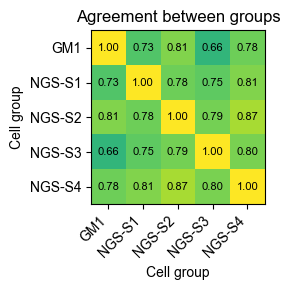

In [9]:
group_names = ['GM1', 'NGS-S1', 'NGS-S2', 'NGS-S3', 'NGS-S4']
group_labels = []
group_spectrograms = []

cluster_ids = g_m_cluster_ids[0]
tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
results = spectral_analysis(tcs_to_use, tl, bs=bs)
spectrograms = results[3] 
S = spectrograms.mean(0)
kmeans = KMeans(n_clusters=2, random_state=0, n_init='auto')
labels = kmeans.fit_predict(S.T)
group_labels.append(labels)
group_spectrograms.append(S)

for s in [0,1,2,3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3] 
    S = spectrograms.mean(0)
    kmeans = KMeans(n_clusters=2, random_state=0, n_init='auto')
    labels = kmeans.fit_predict(S.T)
    group_labels.append(labels)
    group_spectrograms.append(S)

# calculate agreement between groups
agreements = np.zeros((len(group_spectrograms), len(group_spectrograms)))
for i, m in enumerate(range(len(group_spectrograms))):
    for j, n in enumerate(range(len(group_spectrograms))):
        agreements[i, j] = np.sum(group_labels[i] == group_labels[j]) / len(group_labels[i])


fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(3, 3), squeeze=False)
ax[0,0].imshow(agreements, cmap='viridis', vmin=0, vmax=1)
# offset the x and y ticks to be the group names
ax[0,0].set_xticks(np.arange(len(group_names)))
ax[0,0].set_yticks(np.arange(len(group_names)))
ax[0,0].set_xticklabels(group_names, rotation=45, ha='right')
ax[0,0].set_yticklabels(group_names)
ax[0,0].set_xlabel('Cell group')
ax[0,0].set_ylabel('Cell group')

ax[0,0].set_title('Agreement between groups')   
# add agreeement values to the cells
for i in range(len(group_names)):
    for j in range(len(group_names)):
        ax[0,0].text(j, i, f'{agreements[i, j]:.2f}', ha='center', va='center', color='black', fontsize=8)
plt.tight_layout()    
plt.show()

Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules
Identified 1 candidate modules


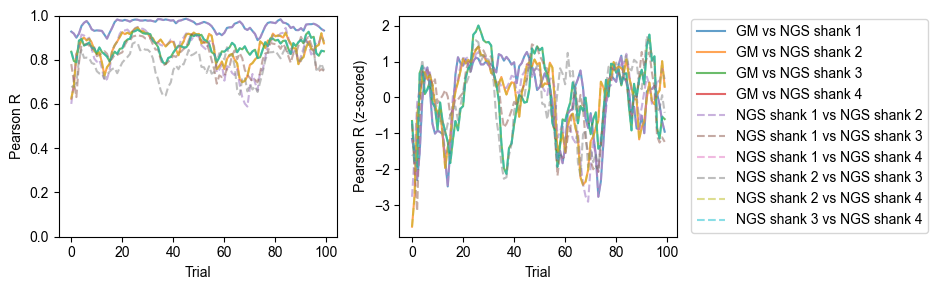

In [ ]:
from scipy import stats

# Prepare spectrograms for GM and each NGS shank
Ss = []
# GM (grid module)
Ss.append(spectrograms.mean(0))

# NGS shanks (shank 1 to 4)
for s in [0, 1, 2, 3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    tcs_shank = {cluster_id: tcs[cluster_id] for cluster_id in cluster_ids if cluster_id in tcs}
    results = spectral_analysis(tcs_shank, tl, bs=bs)
    spectrograms_shank = results[3]
    fvalid = results[5]
    S = spectrograms_shank.mean(0)
    Ss.append(S)

labels = ['GM', 'NGS shank 1', 'NGS shank 2', 'NGS shank 3', 'NGS shank 4']

# Pearson comparisons
gm_vs_shank_corrs = []
shank_vs_shank_corrs = []

for i in range(1, len(Ss)):
    # GM vs each shank
    corrs = [stats.pearsonr(Ss[0][:, t], Ss[i][:, t])[0] for t in range(Ss[0].shape[1])]
    gm_vs_shank_corrs.append(corrs)

# Shank vs shank
for i in range(1, len(Ss)):
    for j in range(i+1, len(Ss)):
        corrs = [stats.pearsonr(Ss[i][:, t], Ss[j][:, t])[0] for t in range(Ss[i].shape[1])]
        shank_vs_shank_corrs.append((i, j, corrs))

# Plotting
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7, 3), squeeze=False)
for i, corrs in enumerate(gm_vs_shank_corrs):
    ax[0,0].plot(corrs, label=f'GM vs {labels[i+1]}', alpha=0.7)
    ax[0,1].plot(zscore(corrs), label=f'GM vs {labels[i+1]}', alpha=0.7)

for i, j, corrs in shank_vs_shank_corrs:
    ax[0,0].plot(corrs, label=f'{labels[i]} vs {labels[j]}', linestyle='--', alpha=0.5)
    ax[0,1].plot(zscore(corrs), label=f'{labels[i]} vs {labels[j]}', linestyle='--', alpha=0.5)

ax[0,0].set_xlabel('Trial')
ax[0,1].set_xlabel('Trial')
ax[0,0].set_ylabel('Pearson R')
ax[0,1].set_ylabel('Pearson R (z-scored)')
ax[0,0].set_ylim(0, 1)
plt.tight_layout()
ax[0,1].legend(loc='center left', bbox_to_anchor=(1.05, 0.5), borderaxespad=0.)
plt.show()

In [ ]:
for s in [0, 1, 2, 3]:
    shank_ngs = ngs[(ngs.probe_x >= (s*250)) & (ngs.probe_x <= (50+(s*250)))]
    cluster_ids = shank_ngs.cluster_id.values
    plot_individual_rate_maps_with_avg_k_means_grouped_spectrogram(mouse, day, cluster_ids=cluster_ids, label=f'_shank{s}_', figpath='/Users/harryclark/Documents/figs/rate_maps_by_shank/')
plot_individual_rate_maps_with_avg_k_means_grouped_spectrogram(mouse, day, cluster_ids=g_m_cluster_ids[0], label=f'_module0_', figpath='/Users/harryclark/Documents/figs/rate_maps_by_grid_module/')


Identified 1 candidate modules
1
[  8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42
  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78
  80  82  84  86  88  90  92  94  96  98 100 102 104 106 108 110 112 114
 116 118 120 122 124 126 128 130 132 134 136 138 140 142 144 146 148 150
 152 154 156 158 160 162 164 166 168 170 172 174 176 178 180 182 184 186
 188 190 192 194 196 198 200 202 204 206]
[]
2
[  8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42
  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78
  80  82  84  86  88  90  92  94  96  98 100 102 104 106 108 110 112 114
 116 118 120 122 124 126 128 130 132 134 136 138 140 142 144 146 148 150
 152 154 156 158 160 162 164 166 168 170 172 174 176 178 180 182 184 186
 188 190 192 194 196 198 200 202 204 206]
[]
3
[  8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42
  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  

: 